In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')
from collections import Counter
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score,
    f1_score, roc_auc_score, classification_report,
    confusion_matrix
)
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB,BernoulliNB
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.linear_model import SGDClassifier
from mlxtend.classifier import StackingCVClassifier
from numpy import loadtxt
from xgboost import XGBClassifier
import itertools
from sklearn.dummy import DummyClassifier
from sklearn import metrics
from sklearn.metrics import accuracy_score
from numpy import set_printoptions
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.feature_selection import mutual_info_regression
from sklearn.feature_selection import RFE
from sklearn.preprocessing import LabelBinarizer
from sklearn.utils import resample
from imblearn.datasets import make_imbalance
from imblearn.over_sampling import SMOTE,  ADASYN
from imblearn.combine import SMOTETomek, SMOTEENN
import dtale
import time
from sklearn.model_selection import learning_curve

In [ ]:
data = pd.read_csv("D:\\COLLEGE\\3rd Year\6TH SEM\Neural Network and Deep Learning\Custom_CNN_Features.csv")

FileNotFoundError: [Errno 2] No such file or directory: 'Custom_CNN_Features.csv'

In [ ]:
data.head()

,Filename,Class Label,f0,f1,f2,f3,f4,f5,f6,f7,...,f190,f191,f192,f193,f194,f195,f196,f197,f198,f199
0,1.png,2,50.557468,0.0,0.0,0.0,0.0,0.0,0.000000,0,...,316.271667,0.0,239.577011,277.834534,205.776398,0.0,0.0,0.0,0.0,91.438698
1,10.jpg.png,2,125.256027,0.0,0.0,0.0,0.0,0.0,48.989120,0,...,1317.333740,0.0,1000.075012,1118.496948,1030.366699,0.0,0.0,0.0,0.0,297.483124
2,10.png,2,50.160606,0.0,0.0,0.0,0.0,0.0,0.000000,0,...,330.470978,0.0,251.886398,288.062134,220.889481,0.0,0.0,0.0,0.0,93.795654
3,100.png,2,63.720730,0.0,0.0,0.0,0.0,0.0,0.000000,0,...,442.839233,0.0,345.145599,389.100678,304.433990,0.0,0.0,0.0,0.0,117.381721
4,10091.jpg,2,64.484604,0.0,0.0,0.0,0.0,0.0,37.368713,0,...,835.147400,0.0,649.643616,693.101868,690.640564,0.0,0.0,0.0,0.0,159.916016


In [ ]:
data.describe()

,Class Label,f0,f1,f2,f3,f4,f5,f6,f7,f8,...,f190,f191,f192,f193,f194,f195,f196,f197,f198,f199
count,3253.000000,3253.000000,3253.000000,3253.000000,3253.000000,3253.000000,3253.000000,3253.000000,3253.0,3253.000000,...,3253.000000,3253.000000,3253.000000,3253.000000,3253.000000,3253.000000,3253.000000,3253.000000,3253.000000,3253.000000
mean,0.849062,17.516938,57.919104,112.822180,170.829473,17.606476,141.614480,11.035532,0.0,214.312125,...,171.788722,0.000105,156.541866,140.697822,175.032922,137.520308,111.645797,0.830283,71.926779,75.925521
std,0.689245,54.948034,93.672074,96.561850,124.512873,35.626627,99.128478,20.554964,0.0,738.811309,...,549.640363,0.005983,420.492050,471.266997,415.644562,149.519860,105.996694,3.439972,112.191866,135.273056
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,46.988506,85.638191,0.000000,76.372185,0.000000,0.0,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,32.641617,0.000000,0.000000,0.000000
50%,1.000000,0.000000,0.000000,93.278381,160.636246,0.000000,132.048889,0.000000,0.0,0.000000,...,0.000000,0.000000,35.827831,0.000000,59.605762,87.407989,79.497665,0.000000,0.000000,0.000000
75%,1.000000,0.000000,117.704697,159.855179,248.145508,12.160916,207.697266,16.175734,0.0,0.000000,...,52.716290,0.000000,98.118843,13.611436,139.699936,225.686981,175.588440,0.000000,164.374664,107.249413
max,2.000000,781.789490,459.207794,536.879639,760.753845,202.598496,587.289551,217.982010,0.0,10129.193360,...,7535.423828,0.341233,5972.883789,6563.629883,5749.376465,750.316284,571.680176,31.048813,505.643402,1758.735840


In [ ]:
data.ndim

2

In [ ]:
#checking for unique vales
data.nunique()

Filename       3253
Class Label       3
f0              668
f1             1148
f2             2620
               ... 
f195           2420
f196           2571
f197            242
f198           1189
f199           1565
Length: 202, dtype: int64

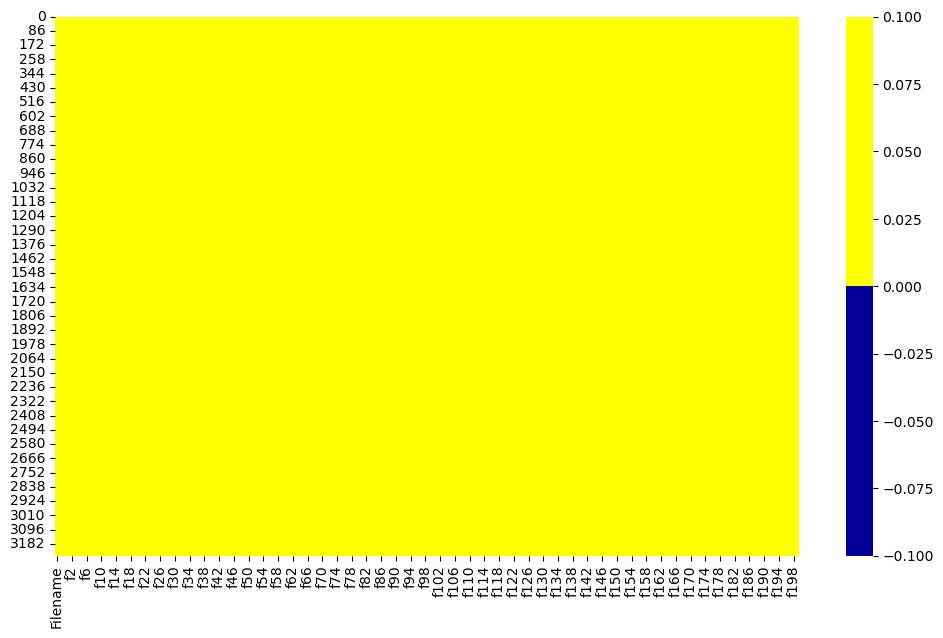

In [ ]:
#heatmap for NA values
import seaborn as sns
plt.figure(figsize=(12,7))
colours = ['#000099', '#ffff00'] #yellow is not missing. blue is missing.
sns.heatmap(data.isnull(),
            cmap = sns.color_palette(colours))
plt.show()

In [ ]:
# identify columns with missing values
cols_with_missing = data.columns[data.isnull().any()]
# display columns with missing values
print(cols_with_missing)

Index([], dtype='object')


In [ ]:
data.drop('Filename', axis = 1, inplace = True)

In [ ]:
data

,Class Label,f0,f1,f2,f3,f4,f5,f6,f7,f8,...,f190,f191,f192,f193,f194,f195,f196,f197,f198,f199
0,2,50.557468,0.0,0.0,0.0,0.0,0.0,0.000000,0,414.879486,...,316.271667,0.0,239.577011,277.834534,205.776398,0.0,0.0,0.0,0.0,91.438698
1,2,125.256027,0.0,0.0,0.0,0.0,0.0,48.989120,0,1736.242432,...,1317.333740,0.0,1000.075012,1118.496948,1030.366699,0.0,0.0,0.0,0.0,297.483124
2,2,50.160606,0.0,0.0,0.0,0.0,0.0,0.000000,0,435.235992,...,330.470978,0.0,251.886398,288.062134,220.889481,0.0,0.0,0.0,0.0,93.795654
3,2,63.720730,0.0,0.0,0.0,0.0,0.0,0.000000,0,588.439148,...,442.839233,0.0,345.145599,389.100678,304.433990,0.0,0.0,0.0,0.0,117.381721
4,2,64.484604,0.0,0.0,0.0,0.0,0.0,37.368713,0,1080.826782,...,835.147400,0.0,649.643616,693.101868,690.640564,0.0,0.0,0.0,0.0,159.916016
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3248,2,283.005707,0.0,0.0,0.0,0.0,0.0,73.068192,0,3528.416992,...,2643.636230,0.0,2036.106934,2269.582275,1973.414917,0.0,0.0,0.0,0.0,657.907715
3249,2,609.193603,0.0,0.0,0.0,0.0,0.0,131.018112,0,8026.524414,...,5950.206055,0.0,4727.840820,5170.731934,4594.757324,0.0,0.0,0.0,0.0,1362.733398
3250,2,781.789490,0.0,0.0,0.0,0.0,0.0,174.997360,0,10129.193360,...,7535.423828,0.0,5972.883789,6563.629883,5749.376465,0.0,0.0,0.0,0.0,1758.735840
3251,2,688.966675,0.0,0.0,0.0,0.0,0.0,206.603851,0,9555.453125,...,7119.000977,0.0,5575.274414,6160.208984,5423.260742,0.0,0.0,0.0,0.0,1670.340088


In [ ]:
data.dtypes

Class Label      int64
f0             float64
f1             float64
f2             float64
f3             float64
                ...   
f195           float64
f196           float64
f197           float64
f198           float64
f199           float64
Length: 201, dtype: object

In [ ]:
x = data.drop('Class Label', axis = 1)
y = data['Class Label']

In [ ]:
X_train,X_test,y_train,y_test = train_test_split(x,y,test_size=0.25,random_state=42)

In [ ]:
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((2439, 200), (2439,), (814, 200), (814,))

In [ ]:
print(y_train.value_counts())

Class Label
1    1258
0     767
2     414
Name: count, dtype: int64


In [ ]:
smote = SMOTE()
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

In [ ]:
print(y_resampled.value_counts())

Class Label
1    1258
2    1258
0    1258
Name: count, dtype: int64


In [ ]:
X = data.select_dtypes(include=[np.number])  # Select numerical columns only

# Calculate matrix rank
matrix_rank = np.linalg.matrix_rank(X)
print(f"Matrix Rank: {matrix_rank}")

Matrix Rank: 175


In [ ]:
dep_cor = data.corr().T.style.background_gradient('copper_r')
dep_cor

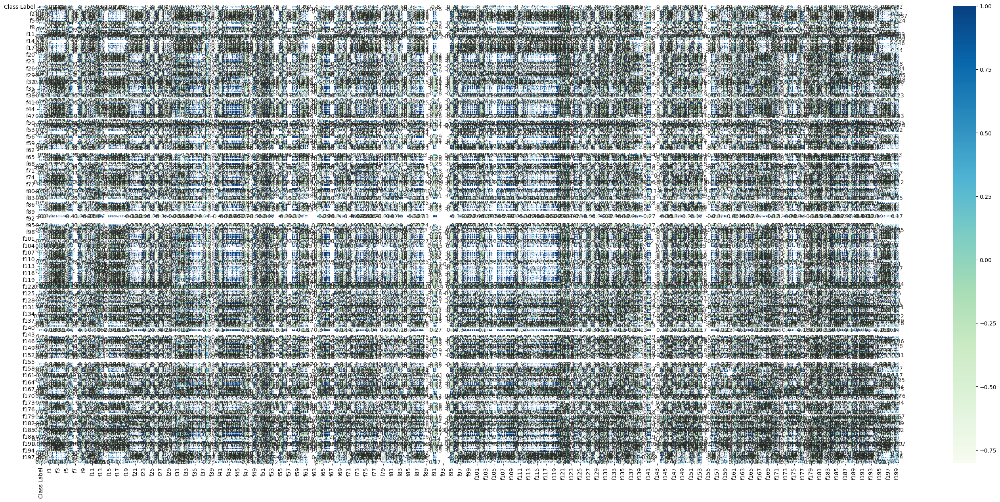

In [ ]:
plt.figure(figsize = (35,15))
sns.heatmap(data.corr(), cmap='GnBu', annot=True,linewidth=.5)
plt.show()

In [ ]:
# Function to get data range
def get_data_range(df):
    data_range = pd.DataFrame({
        'Feature': df.columns,
        'Min': df.min(),
        'Max': df.max(),
        'Range': df.max() - df.min()
    })
    print("Data Range:")
    print(data_range)
    return data_range

In [ ]:
# Function to normalize data
def normalize_data(df, method='minmax'):
    if method == 'minmax':
        scaler = MinMaxScaler()
    elif method == 'standard':
        scaler = StandardScaler()
    else:
        raise ValueError("Method must be 'minmax' or 'standard'")
    
    scaled_data = scaler.fit_transform(df)
    scaled_df = pd.DataFrame(scaled_data, columns=df.columns)
    
    print(f"Data normalized using {method} scaling:")
    print(scaled_df.describe())
    return scaled_df

In [ ]:
data_range = get_data_range(data)

Data Range:
                 Feature  Min          Max        Range
Class Label  Class Label  0.0     2.000000     2.000000
f0                    f0  0.0   781.789490   781.789490
f1                    f1  0.0   459.207794   459.207794
f2                    f2  0.0   536.879639   536.879639
f3                    f3  0.0   760.753845   760.753845
...                  ...  ...          ...          ...
f195                f195  0.0   750.316284   750.316284
f196                f196  0.0   571.680176   571.680176
f197                f197  0.0    31.048813    31.048813
f198                f198  0.0   505.643402   505.643402
f199                f199  0.0  1758.735840  1758.735840

[201 rows x 4 columns]


In [ ]:
# Normalize data (choose method: 'minmax' or 'standard')
normalized_data = normalize_data(x, method='minmax')

Data normalized using minmax scaling:
                f0           f1           f2           f3           f4  \
count  3253.000000  3253.000000  3253.000000  3253.000000  3253.000000   
mean      0.022406     0.126128     0.210144     0.224553     0.086903   
std       0.070285     0.203986     0.179858     0.163670     0.175848   
min       0.000000     0.000000     0.000000     0.000000     0.000000   
25%       0.000000     0.000000     0.087521     0.112570     0.000000   
50%       0.000000     0.000000     0.173742     0.211154     0.000000   
75%       0.000000     0.256321     0.297749     0.326184     0.060025   
max       1.000000     1.000000     1.000000     1.000000     1.000000   

                f5           f6      f7           f8           f9  ...  \
count  3253.000000  3253.000000  3253.0  3253.000000  3253.000000  ...   
mean      0.241132     0.050626     0.0     0.021158     0.125387  ...   
std       0.168790     0.094297     0.0     0.072939     0.202199  ...   

In [ ]:
normalized_data.drop('f7', axis = 1, inplace=True)

In [ ]:
x = normalized_data
y = data['Class Label']

In [ ]:
X_train,X_test,y_train,y_test = train_test_split(x,y,test_size=0.25,random_state=42)

In [ ]:
print(y_train.value_counts())

Class Label
1    1258
0     767
2     414
Name: count, dtype: int64


In [ ]:
smote = SMOTE()
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

In [ ]:
print(y_resampled.value_counts())

Class Label
1    1258
2    1258
0    1258
Name: count, dtype: int64


In [ ]:
# Function to evaluate model performance
def evaluate_model(model, X_train, y_train, X_test, y_test, model_name):
    start_time = time.time()
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    y_train_pred = model.predict(X_train)
    
    end_time = time.time()
    duration = end_time - start_time
    
    # Metrics
    accuracy = accuracy_score(y_test, y_pred) * 100
    precision = precision_score(y_test, y_pred, average='weighted') * 100
    recall = recall_score(y_test, y_pred, average='weighted') * 100
    f1 = f1_score(y_test, y_pred, average='weighted') * 100
    try:
        auroc = roc_auc_score(y_test, model.predict_proba(X_test), multi_class='ovr') * 100
    except AttributeError:
        auroc = "Not Available"
    
    # Print metrics
    print(f"{model_name} Results:")
    print(f"Time Taken: {duration:.2f} seconds")
    print(f"Accuracy: {accuracy:.2f}%")
    print(f"Precision: {precision:.2f}%")
    print(f"Recall: {recall:.2f}%")
    print(f"F1-Score: {f1:.2f}%")
    print(f"AUROC: {auroc}")
    print(classification_report(y_test, y_pred))
    print('Training set score: {:.4f}'.format(model.score(X_train, y_train)))
    print('Test set score: {:.4f}'.format(model.score(X_test, y_test)))
    
    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f'{model_name} Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('Truth')
    plt.show()

    # Learning Curve
    train_sizes, train_scores, val_scores = learning_curve(
        model, X_train, y_train, cv=5, scoring='accuracy', 
        train_sizes=np.linspace(0.1, 1.0, 10), random_state=42
    )
    
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    val_scores_mean = np.mean(val_scores, axis=1)
    val_scores_std = np.std(val_scores, axis=1)

    plt.figure(figsize=(10, 6))
    plt.plot(train_sizes, train_scores_mean, label="Training Score", color="blue")
    plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.1, color="blue")
    plt.plot(train_sizes, val_scores_mean, label="Validation Score", color="orange")
    plt.fill_between(train_sizes, val_scores_mean - val_scores_std, val_scores_mean + val_scores_std, alpha=0.1, color="green")

    plt.xlabel("Training Set Size")
    plt.ylabel("Accuracy Score")
    plt.title(f"Learning Curve for {model_name}")
    plt.legend(loc="best")
    plt.grid(True)
    plt.show()

    return model

In [ ]:
X_train = X_resampled
y_train = y_resampled

Logistic Regression Results:
Time Taken: 0.45 seconds
Accuracy: 92.01%
Precision: 92.11%
Recall: 92.01%
F1-Score: 92.02%
AUROC: 98.26120583782
              precision    recall  f1-score   support

           0       0.95      0.91      0.93       288
           1       0.91      0.92      0.92       376
           2       0.89      0.95      0.92       150

    accuracy                           0.92       814
   macro avg       0.92      0.93      0.92       814
weighted avg       0.92      0.92      0.92       814

Training set score: 0.9375
Test set score: 0.9201


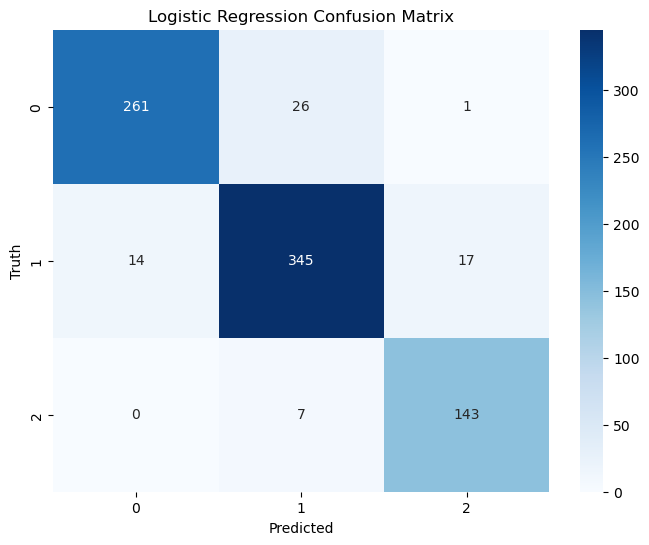

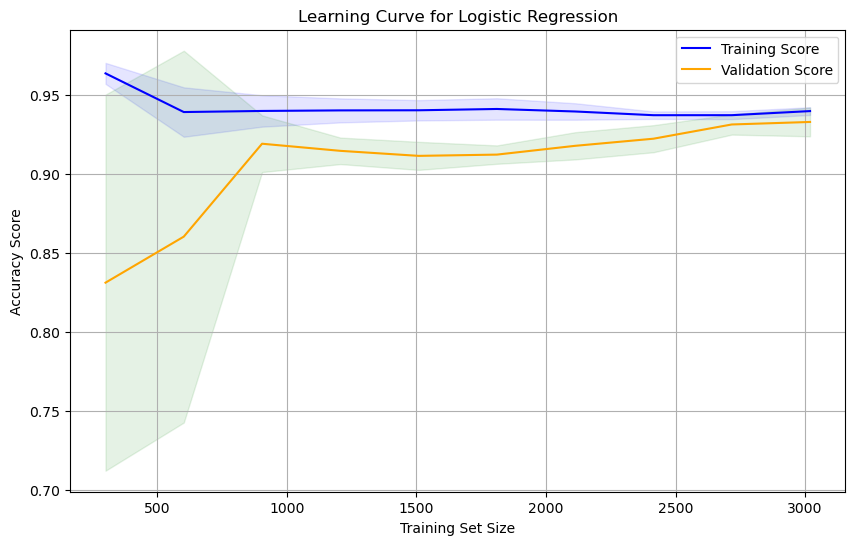

LogisticRegression(C=35111.91734215142)

In [ ]:
# Logistic Regression with Grid Search
lr = LogisticRegression(max_iter=100)
param_grid_lr = {'C': np.logspace(-10, 50, num=100)}
grid_search_lr = GridSearchCV(estimator=lr, param_grid=param_grid_lr, cv=5, scoring='accuracy')
grid_search_lr.fit(X_train, y_train)
lr_best = LogisticRegression(**grid_search_lr.best_params_, max_iter=100)
evaluate_model(lr_best, X_train, y_train, X_test, y_test, "Logistic Regression")

k-Nearest Neighbors Results:
Time Taken: 0.85 seconds
Accuracy: 92.87%
Precision: 92.91%
Recall: 92.87%
F1-Score: 92.87%
AUROC: 96.75740931091967
              precision    recall  f1-score   support

           0       0.95      0.91      0.93       288
           1       0.91      0.93      0.92       376
           2       0.93      0.95      0.94       150

    accuracy                           0.93       814
   macro avg       0.93      0.93      0.93       814
weighted avg       0.93      0.93      0.93       814

Training set score: 0.9539
Test set score: 0.9287


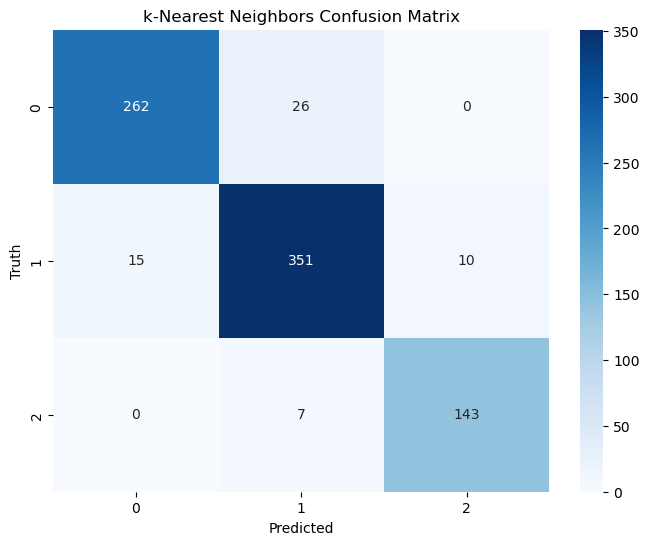

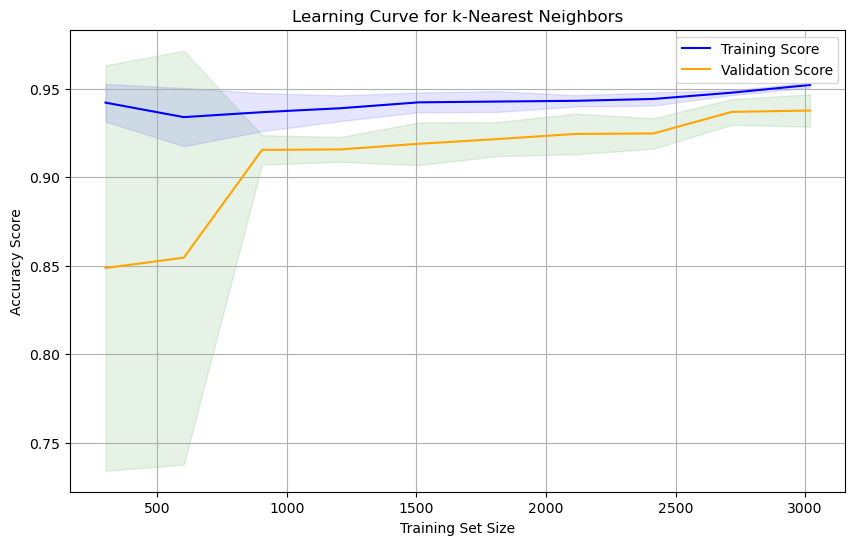

KNeighborsClassifier()

In [ ]:
# kNN
knn = KNeighborsClassifier(n_neighbors=5)
evaluate_model(knn, X_train, y_train, X_test, y_test, "k-Nearest Neighbors")

Decision Tree Results:
Time Taken: 0.74 seconds
Accuracy: 88.94%
Precision: 88.96%
Recall: 88.94%
F1-Score: 88.93%
AUROC: 91.84868574151838
              precision    recall  f1-score   support

           0       0.88      0.91      0.89       288
           1       0.90      0.86      0.88       376
           2       0.90      0.92      0.91       150

    accuracy                           0.89       814
   macro avg       0.89      0.90      0.89       814
weighted avg       0.89      0.89      0.89       814

Training set score: 1.0000
Test set score: 0.8894


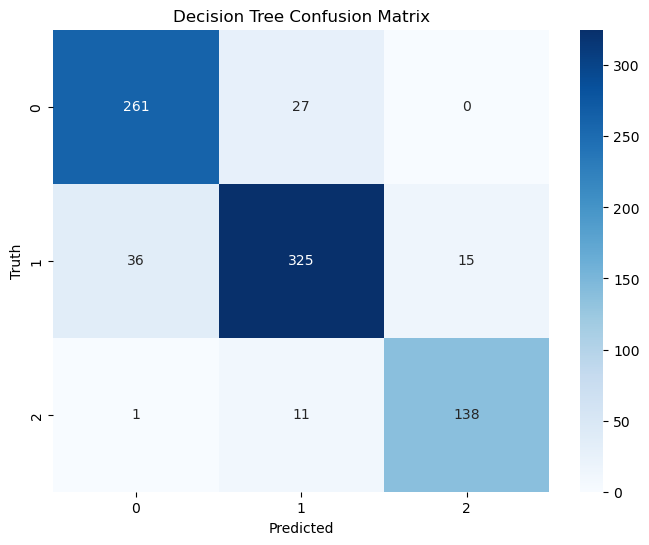

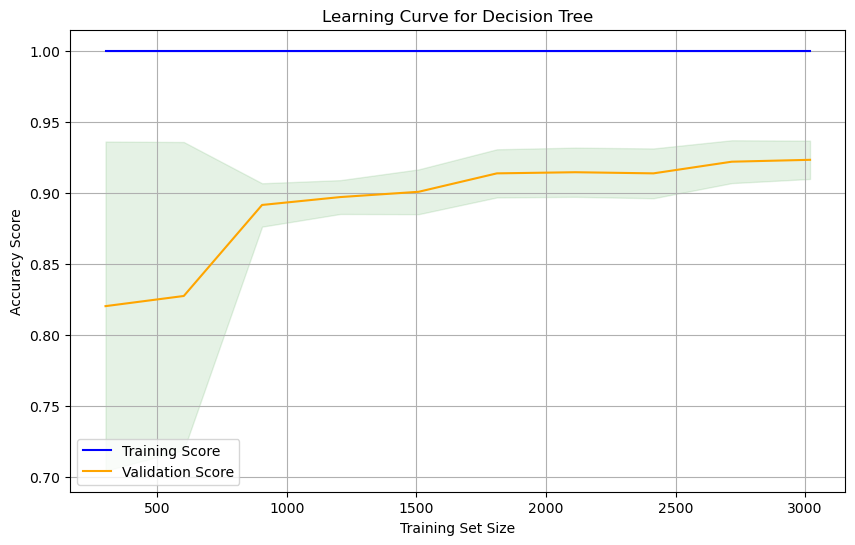

DecisionTreeClassifier()

In [ ]:
# Decision Tree
dt = DecisionTreeClassifier()
evaluate_model(dt, X_train, y_train, X_test, y_test, "Decision Tree")

Support Vector Machines Results:
Time Taken: 4.49 seconds
Accuracy: 91.89%
Precision: 92.01%
Recall: 91.89%
F1-Score: 91.89%
AUROC: 98.08655628962947
              precision    recall  f1-score   support

           0       0.95      0.90      0.92       288
           1       0.91      0.91      0.91       376
           2       0.88      0.97      0.93       150

    accuracy                           0.92       814
   macro avg       0.92      0.93      0.92       814
weighted avg       0.92      0.92      0.92       814

Training set score: 0.9266
Test set score: 0.9189


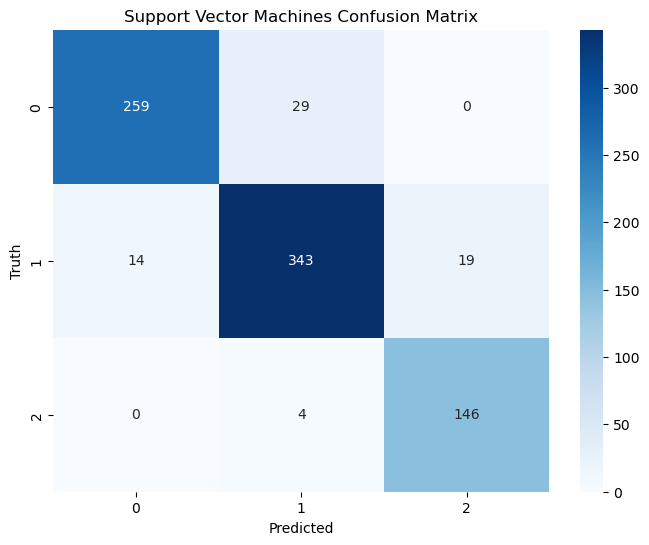

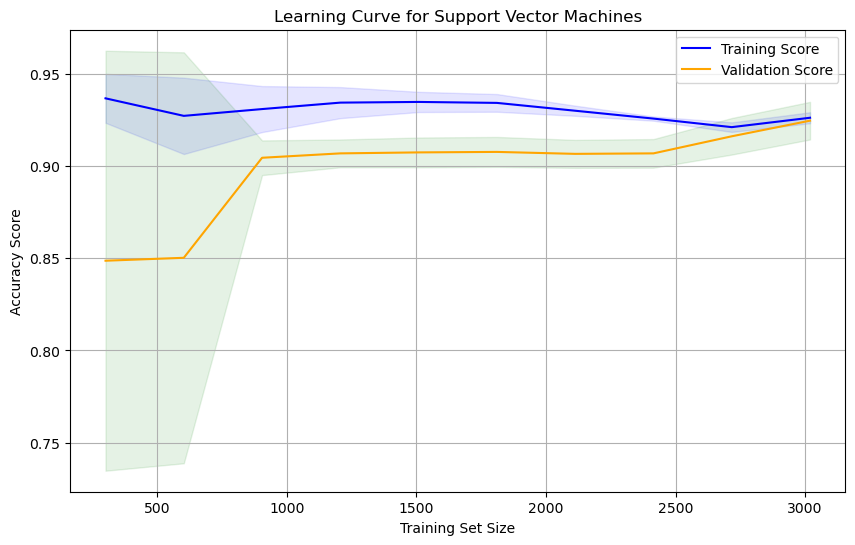

SVC(probability=True)

In [ ]:
# Support Vector Machines
svm = SVC(probability=True)
evaluate_model(svm, X_train, y_train, X_test, y_test, "Support Vector Machines")

Random Forest Results:
Time Taken: 5.42 seconds
Accuracy: 92.26%
Precision: 92.32%
Recall: 92.26%
F1-Score: 92.26%
AUROC: 98.18687214948453
              precision    recall  f1-score   support

           0       0.95      0.90      0.92       288
           1       0.91      0.93      0.92       376
           2       0.92      0.94      0.93       150

    accuracy                           0.92       814
   macro avg       0.92      0.92      0.92       814
weighted avg       0.92      0.92      0.92       814

Training set score: 1.0000
Test set score: 0.9226


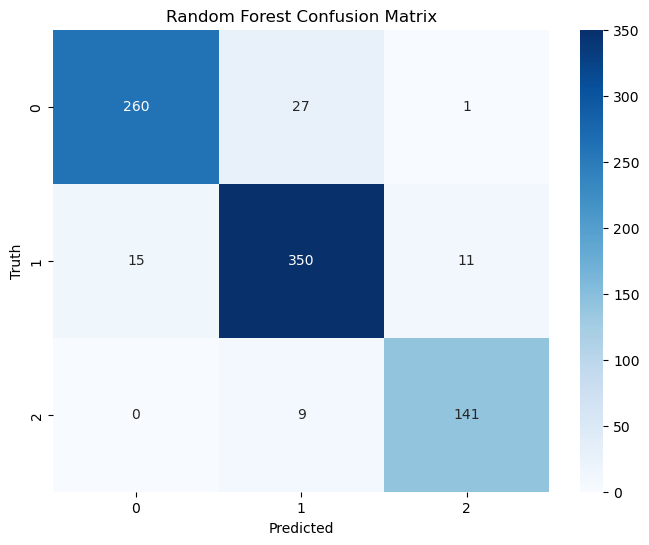

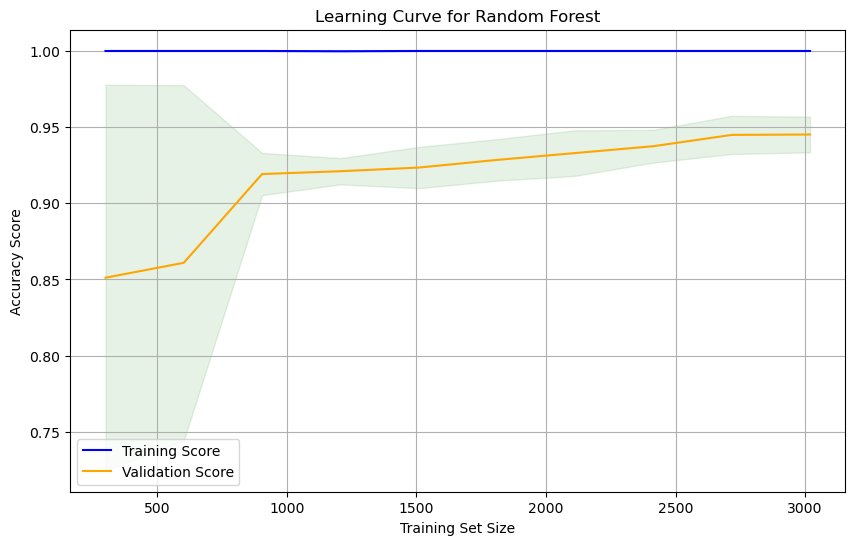

RandomForestClassifier()

In [ ]:
# Random Forest
rf = RandomForestClassifier()
evaluate_model(rf, X_train, y_train, X_test, y_test, "Random Forest")

Naïve Bayes Results:
Time Taken: 0.16 seconds
Accuracy: 92.38%
Precision: 92.54%
Recall: 92.38%
F1-Score: 92.41%
AUROC: 96.67658244459524
              precision    recall  f1-score   support

           0       0.92      0.91      0.92       288
           1       0.90      0.94      0.92       376
           2       0.99      0.91      0.95       150

    accuracy                           0.92       814
   macro avg       0.94      0.92      0.93       814
weighted avg       0.93      0.92      0.92       814

Training set score: 0.9017
Test set score: 0.9238


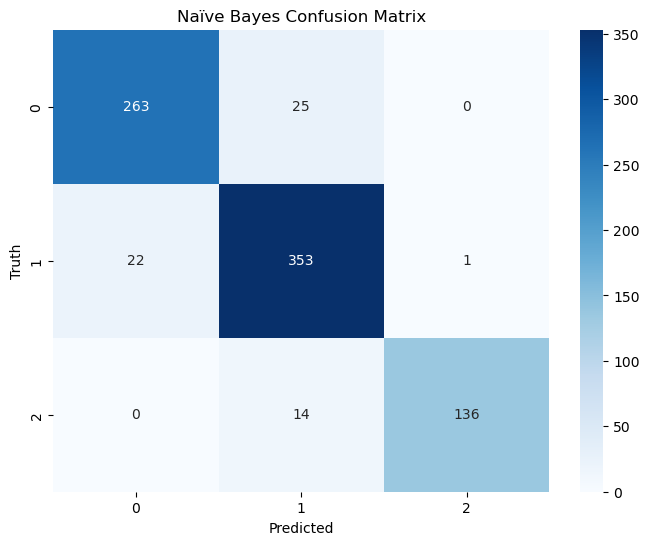

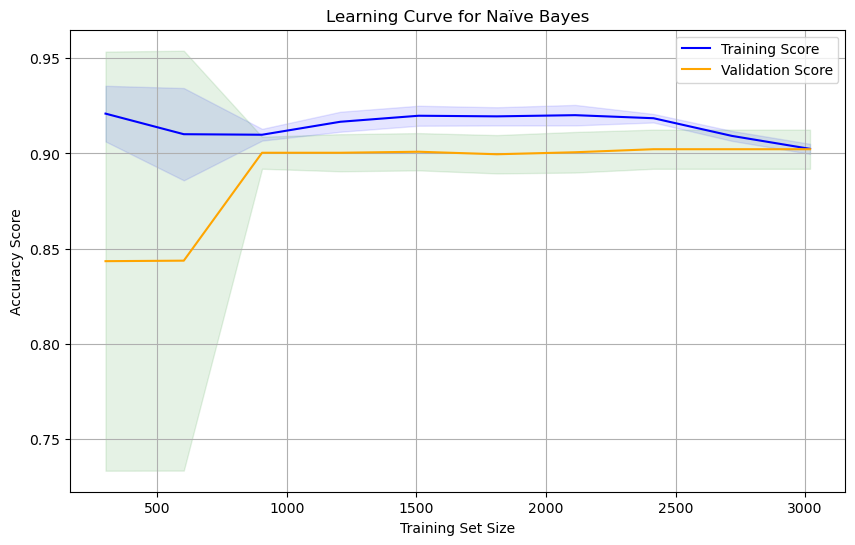

GaussianNB()

In [ ]:
#Naïve Bayes
nb = GaussianNB()
evaluate_model(nb, X_train, y_train, X_test, y_test, "Naïve Bayes")